In [19]:
curr_dir = f'/user_data/csimmon2/git_repos/ptoc'

import sys
sys.path.insert(0,curr_dir)
import matplotlib.pyplot as plt

import numpy as np
import pandas as pd

import itertools
from nilearn import image, plotting, datasets
from nilearn.datasets import load_mni152_brain_mask, load_mni152_template
import nibabel as nib
import pdb
import os
import ptoc_params as params

#hide warning
import warnings
warnings.filterwarnings("ignore")

import pdb


In [22]:
data_dir = params.data_dir
results_dir = params.results_dir
raw_dir = params.raw_dir
extra_raw_dir = '/lab_data/behrmannlab/hemi/Raw'
fig_dir = params.fig_dir

sub_info = params.sub_info
task_info = params.task_info
thresh = params.thresh

suf = params.suf
rois = params.rois
#hemis = params.hemis

#load data summary
data_summary = pd.read_csv(f'{results_dir}/hemispace_summary_vals{suf}.csv') #this was commented out, i'm not sure of my equivalent file

#load subject info
#sub_info = pd.read_csv(f'{curr_dir}/sub_info.csv')
sub_info = pd.read_csv(f'{curr_dir}/sub_info_OTC.csv')

#extract just patients from group
#sub_info = sub_info[sub_info['group']=='patient']

#load mni mask
mni = load_mni152_brain_mask()


FileNotFoundError: [Errno 2] No such file or directory: '/user_data/csimmon2/git_repos/ptoc/results/hemispace_summary_vals.csv'

In [ ]:
import numpy as np
import pandas as pd
from plotnine import *

def calculate_se(group):
    return np.std(group) / np.sqrt(len(group))

def create_violin(data, analysis_name):
    # Convert 'group' to a categorical variable
    data['group'] = data['group'].astype('category')

    # Set the order of 'orient' variable as categorical
    data['orient'] = pd.Categorical(data['orient'], categories=['up', 'down'], ordered=True)

    # Determine the common y-axis limits for both plots
    y_min = data['accu_perc'].min()
    y_max = data['accu_perc'].max()

    for stim in ['bike', 'face']:
        # Subset the data for each stimulus
        subset_data = data[data['stim'] == stim]

        # Calculate mean and standard error for each group and orientation
        group_means_se = subset_data.groupby(['group', 'orient'])['accu_perc'].agg([np.mean, calculate_se]).reset_index()

        # Merge the mean and standard error data
        data_with_se = pd.merge(subset_data, group_means_se, on=['group', 'orient'])

        # Create a new column for label positions
        data_with_se['label_pos'] = data_with_se['mean'] + data_with_se['calculate_se'] + 2

        p = (
            ggplot(data_with_se, aes(x='group', y='accu_perc', fill='orient')) +
            geom_violin(alpha=0.3, position=position_dodge(width=0.9)) +
            geom_linerange(aes(ymin='mean - calculate_se', ymax='mean + calculate_se', fill='orient'),
                           size=1, position=position_dodge(width=0.9)) +
            geom_point(position=position_jitterdodge(jitter_width=0.2), size=2) +
            geom_label(aes(label='code', y='label_pos'), size=8, position=position_dodge(width=0.9), show_legend=False, data=data_with_se, nudge_y=2) + # Adjust nudge_y value if needed
            geom_point(aes(y='mean'), color='black', shape='s', size=4, position=position_dodge(width=0.9)) +
            scale_fill_manual(values=['#ee7183', '#7398af'], name='Orientation') +
            xlab('Group') + ylab(analysis_name) +
            theme_classic() +
            theme(text=element_text(color='black'),
                  axis_text_x=element_text(angle=30, size=16),
                  axis_text_y=element_text(size=16),
                  axis_title=element_text(size=18),
                  axis_line=element_line(),
                  legend_position='right',
                  legend_text=element_text(size=14),
                  legend_key_size=12,
                  legend_title=element_text(size=16),  # Set legend title size
                  plot_title=element_text(size=18),
                  panel_border=element_blank(),
                  figure_size=(8, 5)) +
            labs(fill='Group', title=f'Stimulus: {stim.capitalize()}') +
            ylim(y_min, y_max)  # Set y-axis limits
        )

        print(p)

# Assuming 'data_summary' is the DataFrame containing the data and 'accu_perc' is one of its columns.
create_violin(data_summary, analysis_name='Accuracy (%)')


In [18]:
"""
Plot anatomical data: Select Subjects for Behavioral
"""

def plot_subject(sub_code, hemi, dim_val, ax, code, group, xcoord=None, ycoord=None, zcoord=None):
    sub_dir = f'{raw_dir}/{sub_code}/ses-01'
    anat = image.load_img(f'{sub_dir}/anat/{sub_code}_ses-01_T1w.nii.gz')
    
    if xcoord is None:
        xcoord = 25 if hemi == 'left' else -25
    
    if ycoord is None:
        ycoord = -25
    
    if zcoord is None:
        zcoord = 25
    
    display = plotting.plot_anat(anat, cut_coords=(xcoord, ycoord, zcoord), draw_cross=False, dim=dim_val, axes=ax)
    ax.title.set_text(f'{group} {code}')

import matplotlib.pyplot as plt

#dim_vals = [-1.25, -1.25, -1.25, -1.25]
dim_vals = [-1.25, -1.25, -1.25, -1.25, -1.25, -1.25, -1.25, -1.25]
fig, ax = plt.subplots(nrows=4, ncols=2, figsize=(18, 12), facecolor='w')
fig2, ax2 = plt.subplots(nrows=4, ncols=2, figsize=(18, 12), facecolor='w')


# Subject codes and their corresponding hemispheres and coordinates

# Intact RIGHT: sub-007, sub-076, sub-090, sub-092, sub-099, sub-066, sub-069, sub-078
# Intact LEFT: sub-089, sub-098, sub-101, sub-004, sub-075, sub-077, sub-079, sub-091 

left_patients = [
    ('sub-077','right', -25, 25, 25),
    ('sub-079','left', 25, 15, 15),
    ('sub-075','left', -25, 25, -15),
    ('sub-101', 'left'),
    ('sub-004','right', -25,-25,-15),
    ('sub-089', 'left', 25, -45, -15), 
    ('sub-098', 'right', -25, -25, 25), 
    ('sub-091', 'right') 
]
 
right_patients = [
    ('sub-099', 'left'),
    ('sub-066', 'right'),
    ('sub-069', 'left'),
    ('sub-092', 'right'),
    ('sub-090', 'left'),
    ('sub-007', 'left', -45, 25, -15),
    ('sub-076', 'right', -45, 25, 0),
    ('sub-078', 'right', -45, 35, -5)
]

controls = [
    ('sub-038', 'right', -25),
    ('sub-057', 'right', -25),
    ('sub-093', 'right', -25),
    ('sub-094', 'right', -25),
]

# Add individual titles for controls
#control_titles = ['1', '2', '3', '4']

#for i, (sub_code, hemi, *coords) in enumerate(controls):  # Use *coords to handle optional xcoord, ycoord, and zcoord
#    xcoord, ycoord, zcoord = coords if len(coords) == 3 else (None, None, None)
#    plot_subject(sub_code, hemi, dim_vals[i], ax[i, 0], control_titles[i], 'Control', xcoord, ycoord, zcoord)

left_titles = [
    'Patient KI, LH, Age 7y 9m, Hemispherectomy',
    'Patient EC, LH, Age 16y 7m, Occipitotemporal Ablation', 
    'Patient ED, LH, Age 11y 7m, Occipitotemporal Lobectomy',
    'Patient BN, LH, Age 17y 5m, Hemispherectomy', 
    'Patient UD, LH, Age 14y 4m, Occipitotemporal Lobectomy', 
    'Patient ON, LH, Age 18y 4m, Occipitotemporal Lobectomy', 
    'Patient BI, LH, Age 16y 2m, Hemispherectomy',
    'Patient SI, LH, Age 37y 4m, Hemispherectomy'
 ]

right_titles = [
    'Patient KN, RH, Age 11y 6m, Hemispherectomy', 
    'Patient JF, RH, Age 16y 8m, Hemispherectomy', 
    'Patient NM, RH, Age 12y, Hemispherectomy',
    'Patient FO, RH, Age 19y 9m, Hemispherectomy',
    'Patient KT, RH, Age 15y 5m, Functional Hemispherectomy',
    'Patient OT, RH, Age 21y 4m, Temporal Lobectomy', 
    'Patient JH, RH, Age 16y 2m, Occipitotemporal Lobectomy',
    'Patient IT, RH, Age 22y 2m, Occipitotemporal Lobectomy'
]

for i, (sub_code, hemi, *coords) in enumerate(left_patients):
    xcoord, ycoord, zcoord = coords if len(coords) == 3 else (None, None, None)
    row = i // 2  # Calculate the row for the current subject (0-3)
    col = i % 2  # Calculate the column for the current subject (0 or 1)
    plot_subject(sub_code, hemi, dim_vals[i], ax[row, col], left_titles[i], '', xcoord, ycoord, zcoord)

for i, (sub_code, hemi, *coords) in enumerate(right_patients):
    xcoord, ycoord, zcoord = coords if len(coords) == 3 else (None, None, None)
    row = i // 2  # Calculate the row for the current subject (0-3)
    col = i % 2  # Calculate the column for the current subject (0 or 1)
    plot_subject(sub_code, hemi, dim_vals[i], ax2[row, col], right_titles[i], '', xcoord, ycoord, zcoord)

dpi = 300

fig.savefig('left_patients.png', dpi=dpi, bbox_inches='tight')
fig2.savefig('right_patients.png', dpi=dpi, bbox_inches='tight')
    
plt.show()
plt.pause(0.0001)


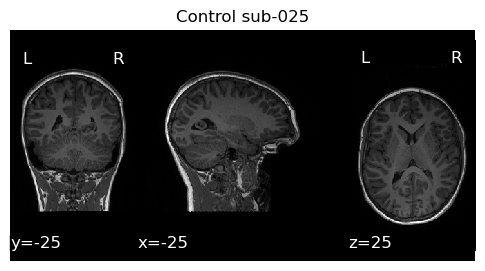

<Figure size 640x480 with 0 Axes>

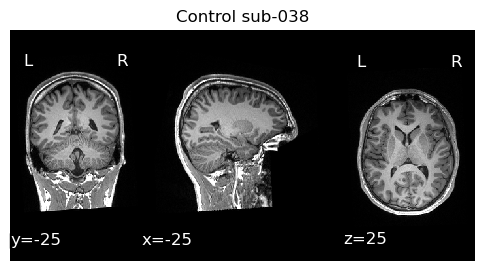

<Figure size 640x480 with 0 Axes>

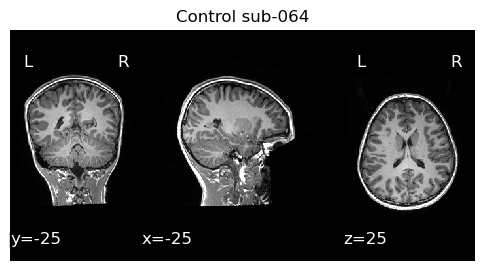

<Figure size 640x480 with 0 Axes>

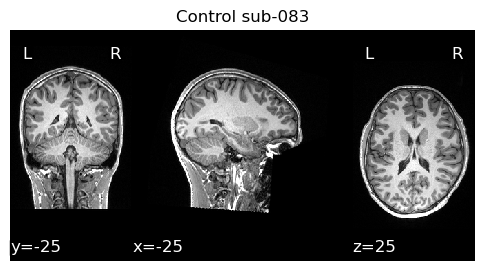

<Figure size 640x480 with 0 Axes>

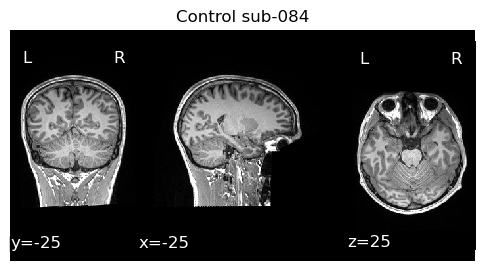

<Figure size 640x480 with 0 Axes>

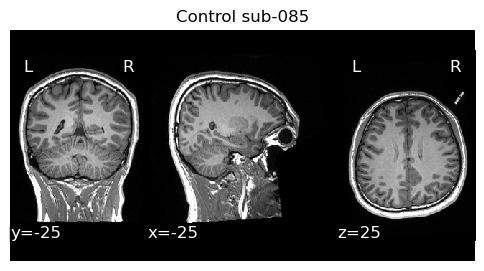

<Figure size 640x480 with 0 Axes>

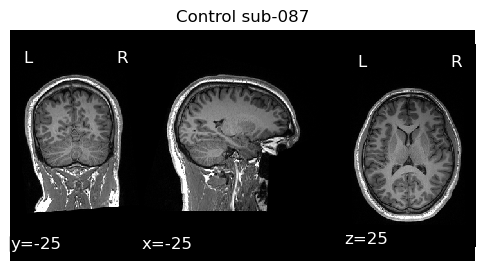

<Figure size 640x480 with 0 Axes>

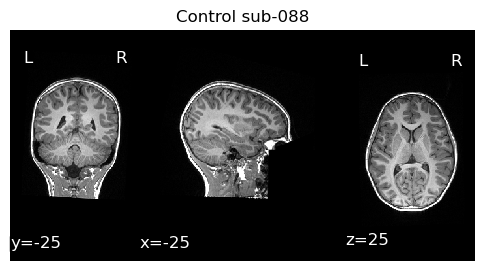

<Figure size 640x480 with 0 Axes>

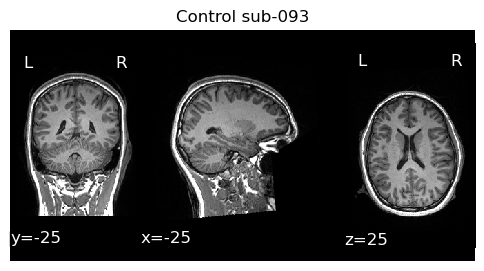

<Figure size 640x480 with 0 Axes>

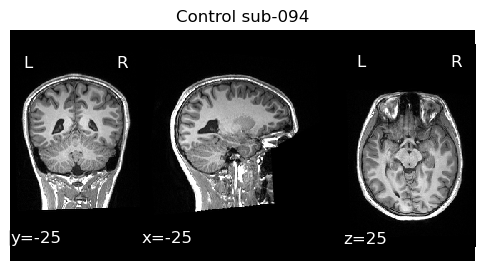

<Figure size 640x480 with 0 Axes>

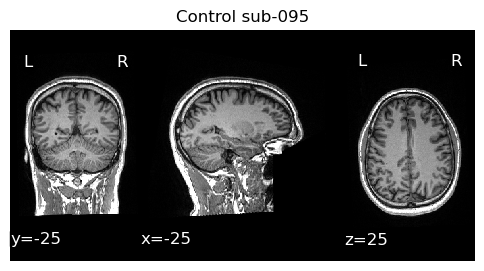

<Figure size 640x480 with 0 Axes>

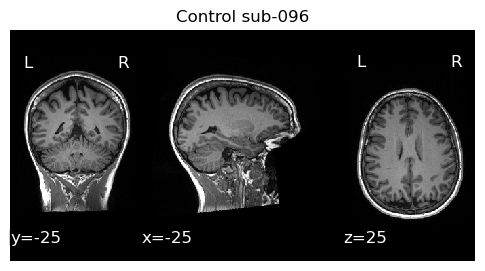

<Figure size 640x480 with 0 Axes>

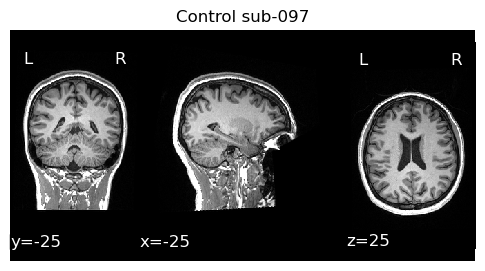

<Figure size 640x480 with 0 Axes>

In [84]:
"""
Plot anatomical data: ALL CONTROL Subjects for Behavioral saved in HEMISPACE

FUNCTIONAL
"""

import os
import matplotlib.pyplot as plt

# Define a list of dim_vals to match the number of control subjects
dim_vals = [-1.25] * len(control_subjects)

# Define a list of control subjects
control_subjects = [
    'sub-025',
    'sub-038',
    'sub-064',
    'sub-083',
    'sub-084',
    'sub-085',
    'sub-087',
    'sub-088',
    'sub-093',
    'sub-094',
    'sub-095',
    'sub-096',
    'sub-097'
]

for sub_code in control_subjects:
    # Create a new figure for each subject
    fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(6, 3), facecolor='w')

    xcoord, ycoord, zcoord = None, None, None  # You can set custom coordinates if needed
    control_title = f'{sub_code}'  # Use the subject code as the title
    
    plot_subject(sub_code, 'right', dim_vals[control_subjects.index(sub_code)], ax, control_title, 'Control', xcoord, ycoord, zcoord)

    plt.show()
    plt.pause(0.0001)
    plt.savefig(f'{fig_dir}/control_{sub_code}.jpg')


XC
SI
BI
BN
EB
KT
FO
KN


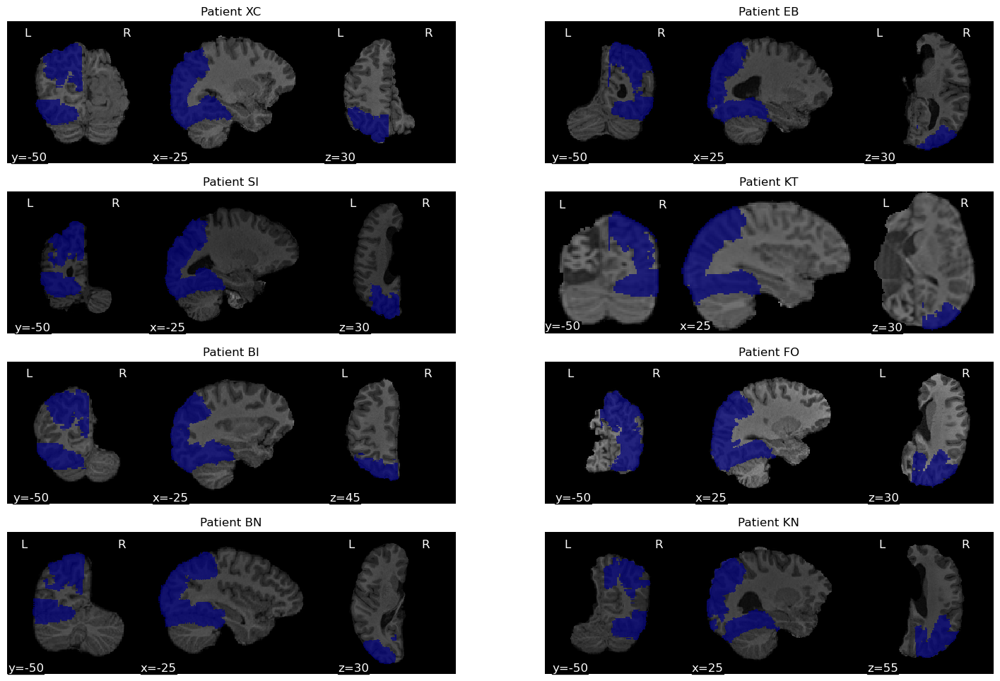

In [ ]:
'''
Plot ROIs on each patient
'''
l_row = -1
r_row = -1
n =0
z_coord = [30,30,45,30,30,30,30,55]
fig, ax = plt.subplots(nrows=4, ncols=2, figsize=(18, 12), facecolor='w')
for sub, code, hemi in zip(sub_info['sub'], sub_info['code'], sub_info['intact_hemi']):
    print(code)
    sub_dir = f'{raw_dir}/{sub}/ses-01'

    if hemi == 'left':
        hemi_col = 0
        l_row = l_row +1
        row = l_row
        xcoord = -25
    else:
        hemi_col = 1
        r_row = r_row + 1
        row = r_row
        xcoord = 25

    #load anatomical
    anat = image.load_img(f'{sub_dir}/anat/{sub}_ses-01_T1w_brain.nii.gz')

    hemi_mask = image.load_img(f'{sub_dir}/anat/{sub}_ses-01_T1w_brain_mask_{hemi}.nii.gz')
    
    #load rois
    ventral_roi = image.load_img(f'{sub_dir}/derivatives/rois/parcels/ventral_visual_cortex.nii.gz')
    dorsal_roi = image.load_img(f'{sub_dir}/derivatives/rois/parcels/dorsal_visual_cortex.nii.gz')

    #combine rois
    roi = image.math_img('a+b', a=ventral_roi, b=dorsal_roi)
    #multiple by hemi mask
    roi = image.math_img('a*b', a=roi, b=hemi_mask)

    #binarize mask
    roi = image.math_img('img > 0', img=roi)

    display = plotting.plot_roi(roi, bg_img = anat,draw_cross = False, cut_coords = (xcoord,-50,z_coord[n]), axes=ax[row,hemi_col])

    ax[row,hemi_col].title.set_text(f'Patient {code}')

    n = n+1

#display.savefig(f'{fig_dir}/anatomicals_head.jpg') 
plt.show()

    




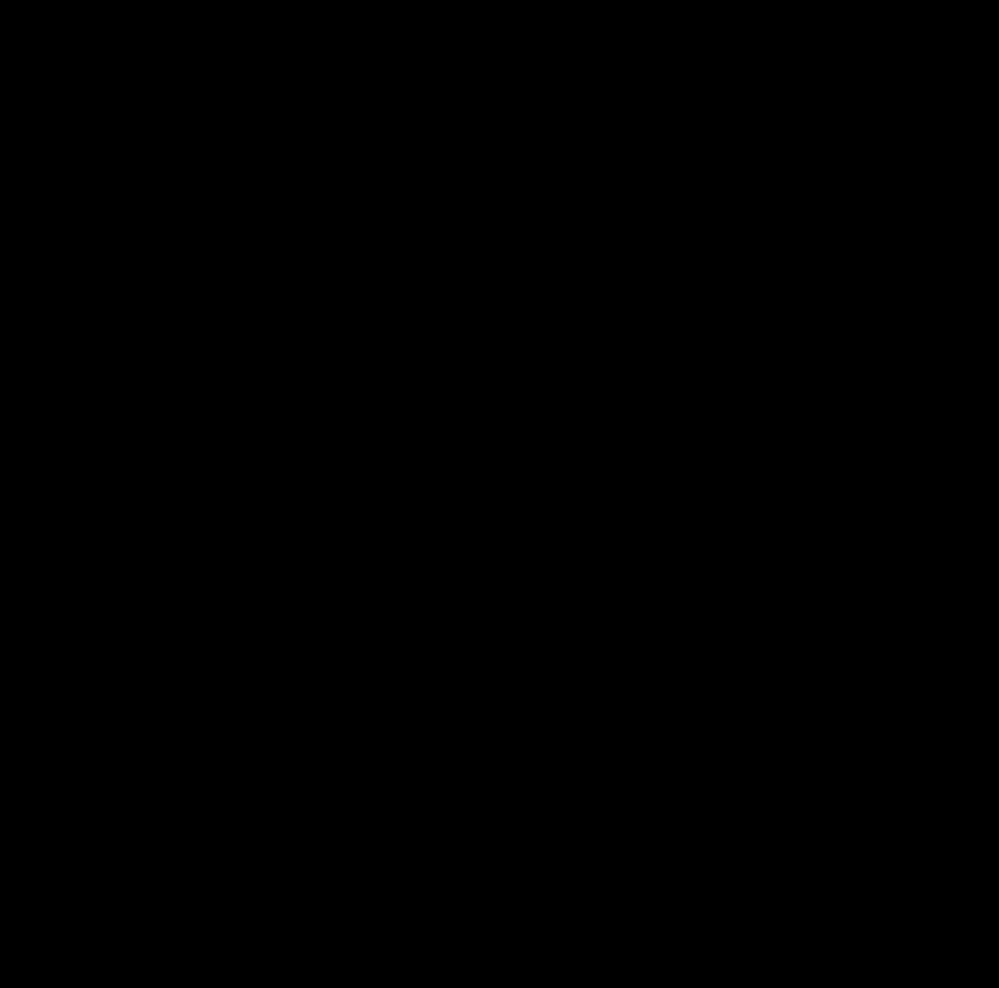
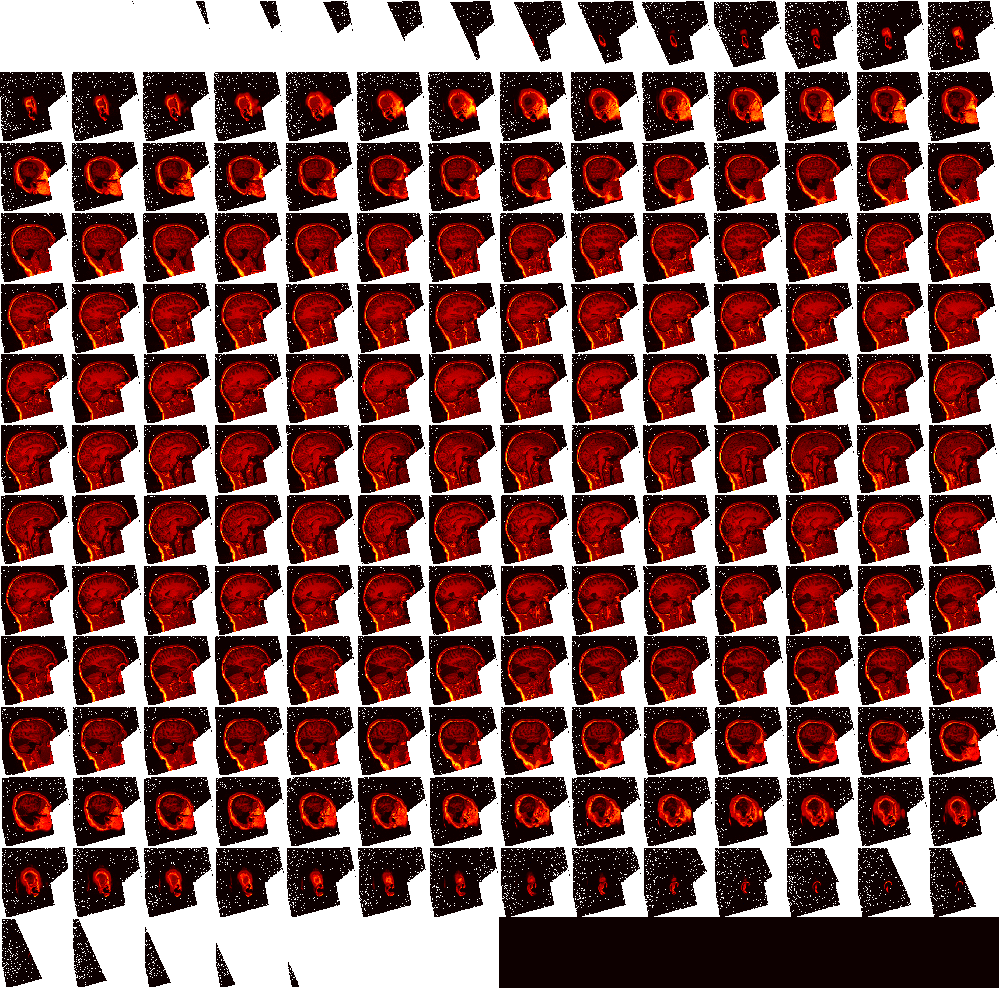

In [ ]:
plotting.view_img(anat, bg_img = None)

In [7]:
task = 'loc'
code = ""
cope = "3"
fig_dir = '/user_data/csimmon2/git_repos/ptoc/results/figures'

zstat_path = f'{sub_dir}/derivatives/fsl/{task}/HighLevel.gfeat/cope{cope}.feat/stats/zstat1_reg.nii.gz'
print('zstat_path')

zstat_path


2.58
right


right
right
right
right
right
right
right
left
left
left
left
left
left
left
left
left


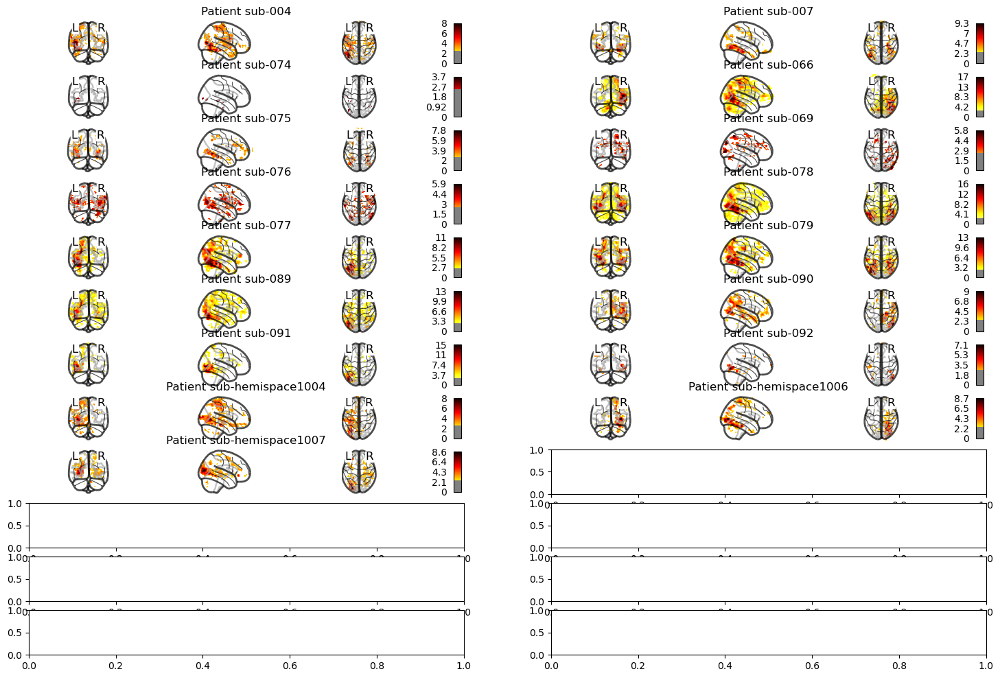

In [7]:
"""
Plot functional data on glass brain
"""
task = 'loc'
code = ""
cope = "3"
fig_dir = '/user_data/csimmon2/git_repos/ptoc/results/figures'


print(thresh)
os.makedirs(f'{fig_dir}/glass_brain', exist_ok=True)
fig, ax = plt.subplots(nrows=9, ncols=2, figsize=(18, 12))

l_row = -1
r_row = -1
for sub, hemi in zip(sub_info['sub'], sub_info['intact_hemi']):
    sub_dir = f'{data_dir}/{sub}/ses-01'

    print(hemi)


    if hemi == 'left':
        hemi_col = 0
        l_row = l_row +1
        row = l_row
    else:
        hemi_col = 1
        r_row = r_row + 1
        row = r_row
    
    #register each highlevel to anat
    zstat_path = f'{sub_dir}/derivatives/fsl/{task}/HighLevel.gfeat/cope{cope}.feat/stats/zstat1_reg.nii.gz'

    #check if zstat exists
    if os.path.exists(zstat_path):
        #load zstat
        zstat = image.load_img(zstat_path)
        #
        zstat = image.threshold_img(zstat,thresh, cluster_threshold=5, two_sided=False)
        #zstat = image.clean_img(zstat,mask_img=mni)
        #create figure

        display = plotting.plot_glass_brain(zstat, axes=ax[row,hemi_col],threshold = thresh, draw_cross = False, colorbar = True)
        ax[row,hemi_col].title.set_text(f'Patient {sub}')

    else:
        display = plotting.plot_glass_brain(mni, axes=ax[row,hemi_col],threshold = thresh, draw_cross = False, colorbar = True)
        ax[row,hemi_col].title.set_text(f'Patient {sub}')
        

display.savefig(f'{fig_dir}/glass_brain/glass_brain.png') 
plt.show()
plt.pause(0.0001)

              

In [11]:
zstat = image.load_img(zstat_path)


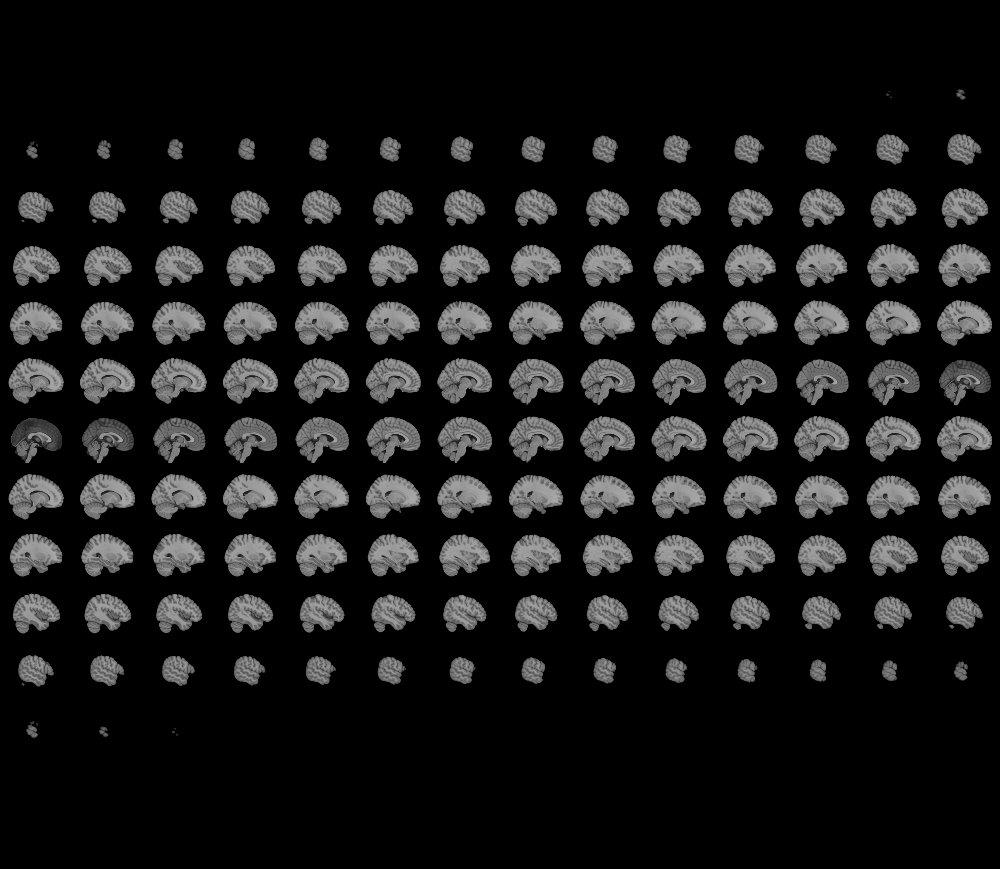
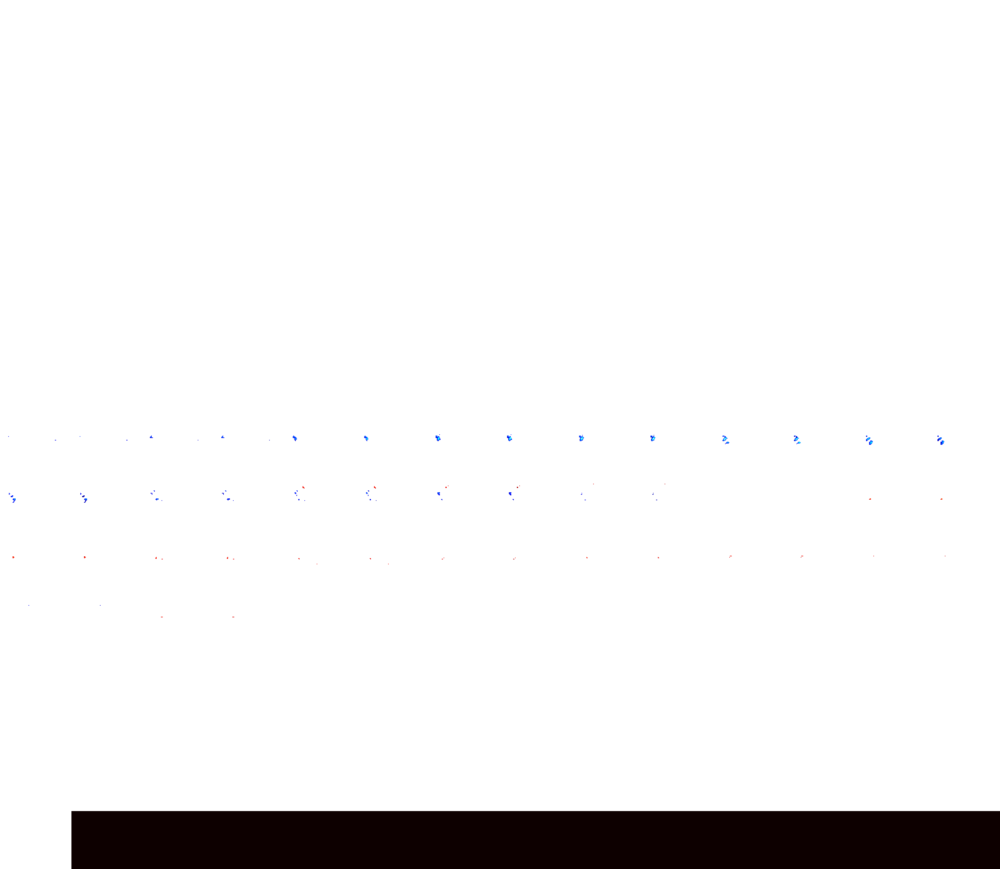

In [12]:
plotting.view_img(zstat, threshold = 2.58)